# SET UP

In [4]:
import numpy as np
import pandas as pd
from tqdm import tqdm
from keras.preprocessing import image
from sklearn.model_selection import train_test_split
import time
import matplotlib.pyplot as plt
import cv2
import keras
#from keras.preprocessing import image
from tqdm import tqdm
import keras.utils as image
#from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.layers import Dense, Activation, Dropout, Flatten, Input, Convolution2D, ZeroPadding2D, MaxPooling2D, Activation
from keras.layers import Conv2D, AveragePooling2D
from keras.models import Model, Sequential
#from tensorflow.keras.models import Model, Sequential
#from tensorflow.keras import Model

In [5]:
# Import the 'os' module to interact with the operating system
import os

# Set the environment variable 'CUDA_VISIBLE_DEVICES' to specify which GPU to use
os.environ["CUDA_VISIBLE_DEVICES"] = "6"


In [6]:
# Initialize tqdm for working with Pandas, enabling progress bars for operations on Pandas objects
tqdm.pandas()


# DATASET

### Reading data from CSV

In [7]:
# Read the training data from the CSV file "fairface_label_train.csv" into a Pandas DataFrame
train_df = pd.read_csv("FairFace/fairface_label_train.csv")

# Read the validation data from the CSV file "fairface_label_val.csv" into a Pandas DataFrame
test_df = pd.read_csv("FairFace/fairface_label_val.csv")


### Shape of the training dataset 

In [8]:
# Print the shape (number of rows and columns) of the training dataset
print("trainset consists of ", train_df.shape)

# Print the shape (number of rows and columns) of the test/validation dataset
print("test set consists of ", test_df.shape)


trainset consists of  (86744, 5)
test set consists of  (10954, 5)


### Modifying the training and test/validation DataFrames, keeping only the 'file' and 'race' columns

In [9]:
# Select only the 'file' and 'race' columns from the training dataset
train_df = train_df[['file', 'race']]

# Select only the 'file' and 'race' columns from the test/validation dataset
test_df = test_df[['file', 'race']]


### Adding the 'FairFace/' prefix to the 'file' column

In [10]:
# Concatenate the 'FairFace/' prefix to the 'file' column in the training dataset
train_df['file'] = 'FairFace/' + train_df['file']

# Concatenate the 'FairFace/' prefix to the 'file' column in the test/validation dataset
test_df['file'] = 'FairFace/' + test_df['file']


In [11]:
train_df.head()

,file,race
0,FairFace/train/1.jpg,East Asian
1,FairFace/train/2.jpg,Indian
2,FairFace/train/3.jpg,Black
3,FairFace/train/4.jpg,Indian
4,FairFace/train/5.jpg,Indian


### Percentage Distribution

In [12]:
# Calculate the percentage distribution of samples in the training dataset based on the 'race' column
# Group by 'race', count the occurrences, calculate the percentage, and display the result
percentage_distribution = 100 * train_df.groupby(['race']).count()[['file']] / train_df.groupby(['race']).count()[['file']].sum()

# Print the result
print(percentage_distribution)


                      file
race                      
Black            14.102416
East Asian       14.164668
Indian           14.201559
Latino_Hispanic  15.409711
Middle Eastern   10.624366
Southeast Asian  12.444665
White            19.052615


### Merging races

In [13]:
# Grouping 'East Asian' and 'Southeast Asian' races into a single category 'Asian' in the training dataset
idx = train_df[(train_df['race'] == 'East Asian') | (train_df['race'] == 'Southeast Asian')].index
train_df.loc[idx, 'race'] = 'Asian'

# Grouping 'East Asian' and 'Southeast Asian' races into a single category 'Asian' in the test/validation dataset
idx = test_df[(test_df['race'] == 'East Asian') | (test_df['race'] == 'Southeast Asian')].index
test_df.loc[idx, 'race'] = 'Asian'


#### Above code combines the categories 'East Asian' and 'Southeast Asian' into a single category 'Asian'.

### Again Percentage Distribution


In [14]:
# Calculate the percentage distribution of samples in the training dataset based on the 'race' column
# Group by 'race', count the occurrences, calculate the percentage, and display the result
percentage_distribution = 100 * train_df.groupby(['race']).count()[['file']] / train_df.groupby(['race']).count()[['file']].sum()

# Print the result
print(percentage_distribution)


                      file
race                      
Asian            26.609333
Black            14.102416
Indian           14.201559
Latino_Hispanic  15.409711
Middle Eastern   10.624366
White            19.052615


In [15]:
# Define the target size for the images
target_size = (224, 224)

# Function to get pixels from an image file
def getImagePixels(file):
    # Load the image, convert it to grayscale, and resize it to the target size
    img = image.load_img(file, grayscale=False, target_size=target_size)
    
    # Convert the image to a NumPy array and flatten it to a 1D array
    x = image.img_to_array(img).reshape(1, -1)[0]
    
    # Return the flattened array of image pixels
    return x


#### The code defines a target size for images and provides a function (getImagePixels) that takes an image file path as input, loads the image, converts it to grayscale, resizes it to the target size, and then flattens it to a 1D array of pixel values. The flattened array is then returned.

In [16]:
# Applying the getImagePixels function to each file path in the 'file' column of the training dataset
train_df['pixels'] = train_df['file'].progress_apply(getImagePixels)

# Applying the getImagePixels function to each file path in the 'file' column of the test/validation dataset
test_df['pixels'] = test_df['file'].progress_apply(getImagePixels)


100%|████████████████████████████████████████████████████████████████████████████| 10954/10954 [03:56<00:00, 46.36it/s]


In [17]:
train_df.head()

,file,race,pixels
0,FairFace/train/1.jpg,Asian,"[8.0, 8.0, 10.0, 9.0, 9.0, 11.0, 10.0, 8.0, 11..."
1,FairFace/train/2.jpg,Indian,"[129.0, 127.0, 104.0, 127.0, 125.0, 102.0, 123..."
2,FairFace/train/3.jpg,Black,"[216.0, 171.0, 174.0, 212.0, 167.0, 170.0, 206..."
3,FairFace/train/4.jpg,Indian,"[42.0, 47.0, 50.0, 42.0, 47.0, 50.0, 41.0, 46...."
4,FairFace/train/5.jpg,Indian,"[44.0, 39.0, 35.0, 44.0, 39.0, 35.0, 43.0, 40...."


### Extracting the pixel values

In [18]:
# Initialize empty lists to store features (pixel values) for training and testing datasets
train_features = []
test_features = []

# Loop through each row in the training dataset
for i in range(0, train_df.shape[0]):
    # Append the 'pixels' values for the current row to the train_features list
    train_features.append(train_df['pixels'].values[i])

# Loop through each row in the testing dataset
for i in range(0, test_df.shape[0]):
    # Append the 'pixels' values for the current row to the test_features list
    test_features.append(test_df['pixels'].values[i])


#### These loops are extracting the pixel values from the 'pixels' column of the training and testing DataFrames and storing them in separate lists (train_features and test_features).

### Reshaping

In [19]:
# Record the starting time to measure the elapsed time for the conversion
tic = time.time()

# Convert the list of training features to a NumPy array
train_features = np.array(train_features)

# Reshape the training features array to match the expected input shape (224x224 pixels, 3 channels for RGB)
train_features = train_features.reshape(train_features.shape[0], 224, 224, 3)

# Convert the list of testing features to a NumPy array
test_features = np.array(test_features)

# Reshape the testing features array to match the expected input shape (224x224 pixels, 3 channels for RGB)
test_features = test_features.reshape(test_features.shape[0], 224, 224, 3)

# Record the ending time after the conversion is complete
toc = time.time()

# Print the elapsed time for the conversion
print("Converted to NumPy in ", toc - tic, "seconds")

Converted to NumPy in  776.923121213913 seconds


### Normalization

In [20]:
# Record the starting time to measure the elapsed time for the normalization
tic = time.time()

# Normalize the pixel values of training features by dividing them by 255
train_features = train_features / 255

# Normalize the pixel values of testing features by dividing them by 255
test_features = test_features / 255

# Record the ending time after the normalization is complete
toc = time.time()

# Print the elapsed time for the normalization
print("Converted to NumPy and normalized in ", toc - tic, "seconds")


Converted to NumPy and normalized in  525.4429550170898 seconds


### Extracting the 'race' information

In [21]:
# Extract the 'race' column from the training DataFrame as the training labels
train_label = train_df[['race']]

# Extract the 'race' column from the testing DataFrame as the testing labels
test_label = test_df[['race']]


### Understanding the different race categories

In [22]:
# Get the unique values in the 'race' column of the training DataFrame
races = train_df['race'].unique()


#### Retrieve the unique values present in the 'race' column of the training DataFrame (train_df). The resulting races variable will contain an array or list of distinct race categories present in the training dataset.

### Label encoding on the 'race' column

In [23]:
# Loop through each unique race category for label encoding
for j in range(len(races)):
    # Get the current race category
    current_race = races[j]

    # Print information about the label encoding process
    print("Replacing ", current_race, " with ", j + 1)

    # Replace the current race category with its corresponding label (integer) in the training labels
    train_label['race'] = train_label['race'].replace(current_race, str(j + 1))

    # Replace the current race category with its corresponding label (integer) in the testing labels
    test_label['race'] = test_label['race'].replace(current_race, str(j + 1))

# Convert the data type of the 'race' column in the training labels to int32
train_label = train_label.astype({'race': 'int32'})

# Convert the data type of the 'race' column in the testing labels to int32
test_label = test_label.astype({'race': 'int32'})


Replacing  Asian  with  1
Replacing  Indian  with  2
Replacing  Black  with  3
Replacing  White  with  4
Replacing  Middle Eastern  with  5
Replacing  Latino_Hispanic  with  6


C:\Users\Administrator\AppData\Local\Temp\ipykernel_15632\2426373543.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_label['race'] = train_label['race'].replace(current_race, str(j + 1))
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15632\2426373543.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_label['race'] = test_label['race'].replace(current_race, str(j + 1))


In [24]:
train_label.head()

,race
0,1
1,2
2,3
3,2
4,2


### Binary columns corresponding to each unique label 

In [25]:
# Perform one-hot encoding on the 'race' column in the training labels
train_target = pd.get_dummies(train_label['race'], prefix='race')

# Perform one-hot encoding on the 'race' column in the testing labels
test_target = pd.get_dummies(test_label['race'], prefix='race')


In [26]:
train_target.head()

,race_1,race_2,race_3,race_4,race_5,race_6
0,1,0,0,0,0,0
1,0,1,0,0,0,0
2,0,0,1,0,0,0
3,0,1,0,0,0,0
4,0,1,0,0,0,0


### Validation set to avoid overfitting

In [27]:
# Split the training data into training and validation sets using train_test_split
# train_x: Features for training, val_x: Features for validation
# train_y: Target labels for training, val_y: Target labels for validation
train_x, val_x, train_y, val_y = train_test_split(train_features, train_target.values, test_size=0.12, random_state=17)


# MODEL

In [28]:
#from tensorflow.keras.models import Sequential
#from tensorflow.keras.layers import ZeroPadding2D, Convolution2D, MaxPooling2D, Dropout, Flatten, Activation

# VGG-Face model architecture

# Create a Sequential model
model = Sequential()
# Convolutional layers with zero-padding and activation functions
model.add(ZeroPadding2D((1,1), input_shape=(224,224,3)))
model.add(Convolution2D(64, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(128, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

# Fully connected layers with dropout for regularization
model.add(Convolution2D(4096, (7, 7), activation='relu'))
model.add(Dropout(0.5))
model.add(Convolution2D(4096, (1, 1), activation='relu'))
model.add(Dropout(0.5))

# Output layer with softmax activation
model.add(Convolution2D(2622, (1, 1)))
model.add(Flatten())
model.add(Activation('softmax'))


### Load pre-trained weights

In [29]:
# Load pre-trained weights for the VGG-Face model from the specified file ('vgg_face_weights.h5')
model.load_weights('vgg_face_weights.h5')

In [30]:
# Assuming 'races' is an array containing unique race labels
#num_of_classes = len(races)

# Alternatively, if you have a specific number of classes (e.g., 6), you can use the following:
num_of_classes = 6

### Creating and Defining new race model

In [31]:
# Freeze all layers of the VGG-Face model except the last 7 layers
for layer in model.layers[:-7]:
    layer.trainable = False

# Create a new model ('race_model') for race classification based on the modified VGG-Face model
# Replace the last layers for specific race classification task
base_model_output = Sequential()
base_model_output = Convolution2D(num_of_classes, (1, 1), name='predictions')(model.layers[-4].output)
base_model_output = Flatten()(base_model_output)
base_model_output = Activation('softmax')(base_model_output)

# Define the 'race_model' with the modified output layers
race_model = Model(inputs=model.input, outputs=base_model_output)


### Compiles the race_model for the race classification task

In [32]:
# Compile the 'race_model' for race classification
# Using categorical crossentropy as the loss function, Adam optimizer, and accuracy as the evaluation metric
race_model.compile(
    loss='categorical_crossentropy',
    optimizer=keras.optimizers.Adam(),
    metrics=['accuracy']
)


# PRE-TRAINED WEIGHTS

In [33]:
# Load pre-trained weights for the race classification model from the specified file ('race_model_single_batch.h5')
race_model.load_weights('race_model_single_batch.h5')

# TRAINING

In [47]:
# ModelCheckpoint callback to save the best weights during training
checkpointer = ModelCheckpoint(
    filepath='race_model_single_batch.hdf5',  # Filepath to save the weights
    monitor="val_loss",  # Monitor validation loss for saving the best weights
    verbose=1,  # Verbosity level (1: detailed output, 0: silent)
    save_best_only=True,  # Save only the best weights based on the monitored quantity
    mode='auto'  # Automatically determine the direction of improvement for the monitored quantity
)


In [48]:
patience=50,  # Number of epochs with no improvement after which training will be stopped

In [49]:
# Lists to store training and validation scores during training
val_scores = []  # Store validation scores (e.g., accuracy, loss)
train_scores = []  # Store training scores (e.g., accuracy, loss)

In [ ]:
# Training the race model with or without batching, and handling early stopping

enableBatch = True  # Flag to enable batch training
epochs = 1000  # Number of training epochs

# Check if batch training is enabled
if enableBatch != True:
    # If batch training is not enabled, use EarlyStopping callback and train the model
    early_stop = EarlyStopping(monitor='val_loss', patience=patience)
    
    # Train the model with specified number of epochs and validation data
    score = race_model.fit(
        train_x, train_y,
        epochs=epochs,
        validation_data=(val_x, val_y),
        callbacks=[checkpointer, early_stop]
    )
else:
    # If batch training is enabled, iterate over epochs and perform batch training
    batch_size = pow(2, 14)
    last_improvement = 0
    best_iteration = 0
    
    loss = 1000000  # Initialize loss as a large value
    
    # Iterate over epochs
    for i in range(0, epochs):
        
        print("Epoch ", i, ". ", end='')
        
        # Randomly select indices for the current batch
        ix_train = np.random.choice(train_x.shape[0], size=batch_size)
        
        # Train the model for one epoch with the current batch and validation data
        score = race_model.fit(
            train_x[ix_train], train_y[ix_train],
            epochs=1,
            validation_data=(val_x, val_y),
            callbacks=[checkpointer]
        )
        
        # Extract validation and training loss from the history
        val_loss = score.history['val_loss'][0]
        train_loss = score.history['loss'][0]

        # Append the loss values to the lists for visualization
        val_scores.append(val_loss)
        train_scores.append(train_loss)
        
        # --------------------------------
        
        # Check if there is a decrease in validation loss
        if val_loss < loss:
            loss = val_loss * 1
            last_improvement = 0
            best_iteration = i * 1
        else:
            last_improvement = last_improvement + 1
            print("try to decrease val loss for ", patience - last_improvement, " epochs more")
        
        # --------------------------------
        
        # Check if early stopping criteria are met
        if last_improvement == patience:
            print("there is no loss decrease in validation for ", patience, " epochs. early stopped")
            break


# Load the best model

In [ ]:
#restore the best weights
from keras.models import load_model
race_model = load_model("race_model_single_batch.h5")

race_model.save_weights('race_model_single_batch.h5')

# Evaluation

In [37]:
test_perf = race_model.evaluate(test_features, test_target.values, verbose=1)
print(test_perf)  

343/343 [==============================] - 3178s 9s/step - loss: 0.8820 - accuracy: 0.6818
[0.8820091485977173, 0.6817600727081299]


In [40]:
validation_perf = race_model.evaluate(val_x, val_y, verbose=1)
print(validation_perf)

326/326 [==============================] - 3699s 11s/step - loss: 0.8854 - accuracy: 0.6783
[0.8853955864906311, 0.6782901287078857]


In [53]:
#Check model is robust
abs(validation_perf[0] - test_perf[0]) < 0.01

True

# Prediction

In [38]:
predictions = race_model.predict(test_features)

343/343 [==============================] - 3718s 11s/step


17
Actual:  White
Predicted:  White


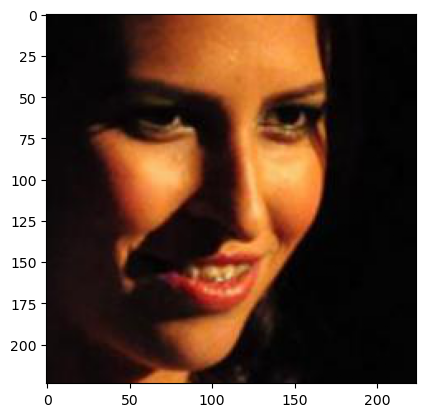

----------------------
33
Actual:  Asian
Predicted:  Asian


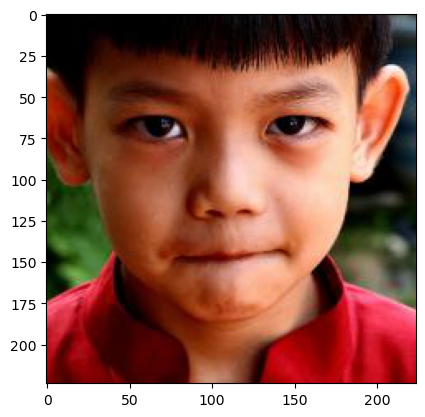

----------------------
83
Actual:  Asian
Predicted:  Asian


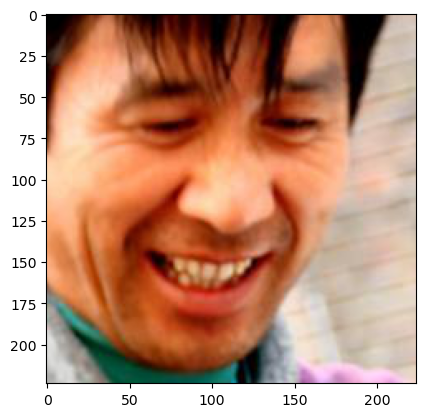

----------------------
109
Actual:  Indian
Predicted:  Indian


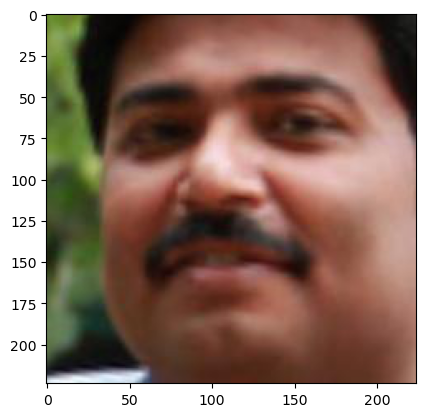

----------------------
124
Actual:  Black
Predicted:  Black


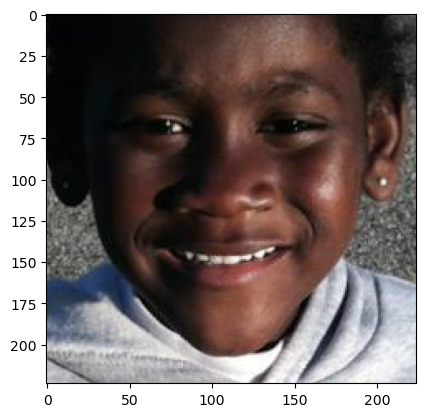

----------------------
203
Actual:  Indian
Predicted:  Indian


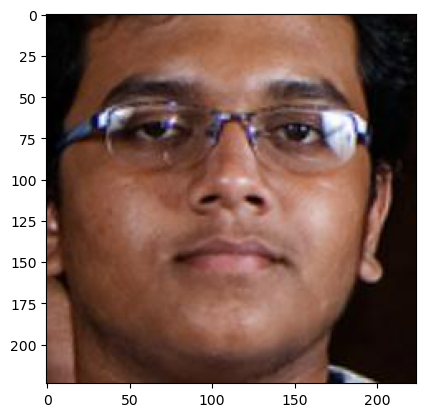

----------------------
235
Actual:  Latino_Hispanic
Predicted:  Asian


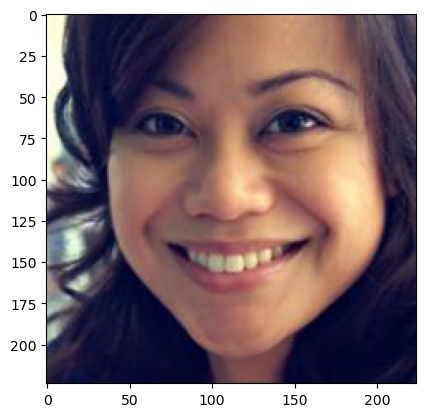

----------------------
237
Actual:  Asian
Predicted:  Asian


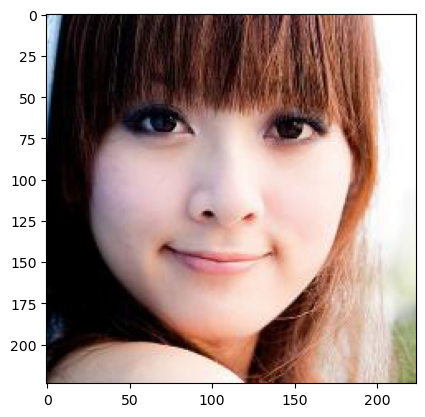

----------------------
339
Actual:  Black
Predicted:  Black


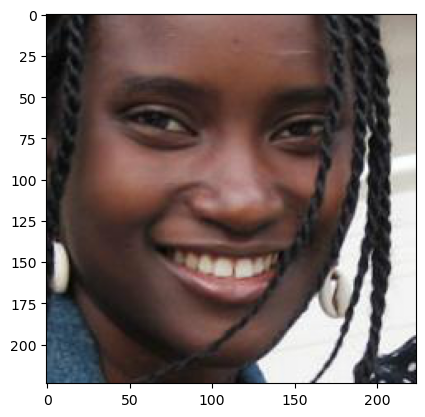

----------------------
375
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


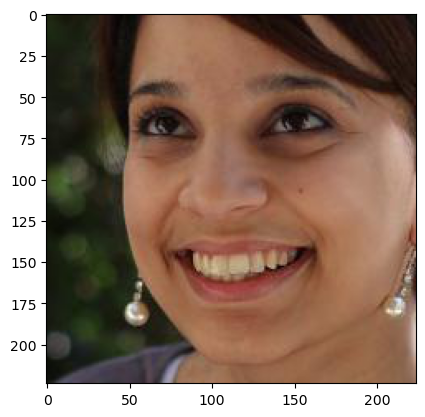

----------------------
413
Actual:  White
Predicted:  White


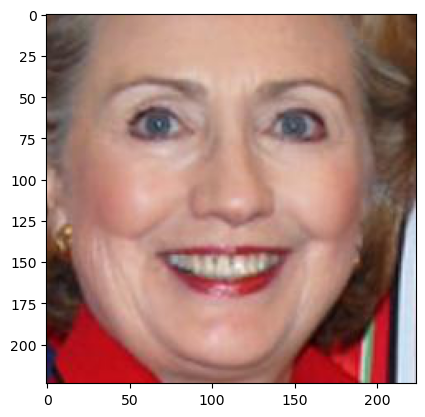

----------------------
447
Actual:  White
Predicted:  White


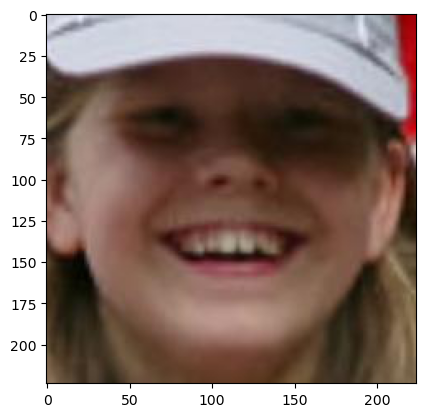

----------------------
470
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


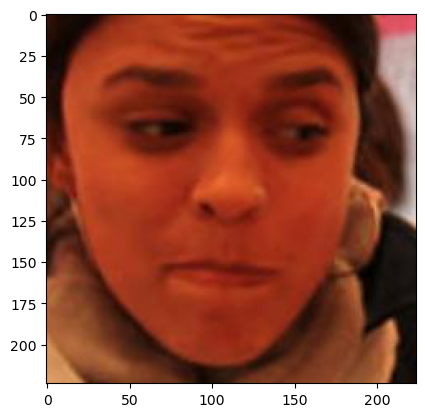

----------------------
573
Actual:  White
Predicted:  White


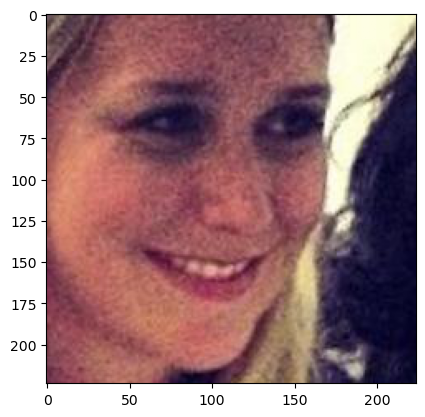

----------------------
609
Actual:  Asian
Predicted:  Asian


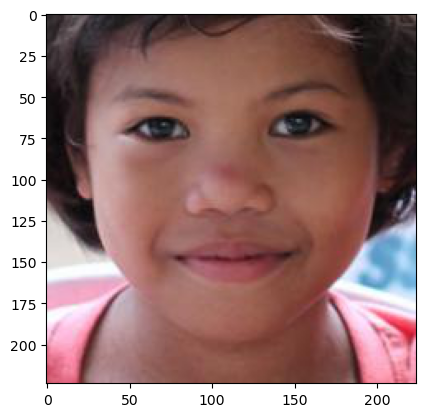

----------------------
638
Actual:  Middle Eastern
Predicted:  Latino_Hispanic


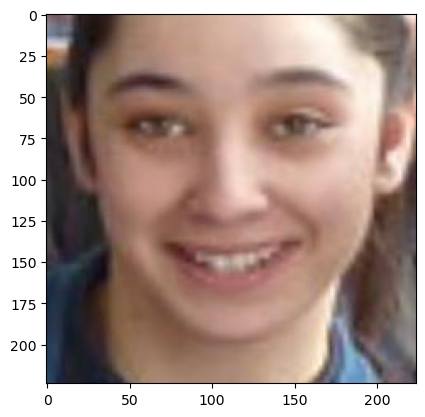

----------------------
649
Actual:  White
Predicted:  White


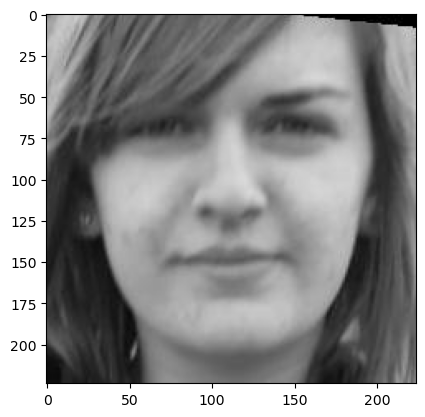

----------------------
718
Actual:  Middle Eastern
Predicted:  Middle Eastern


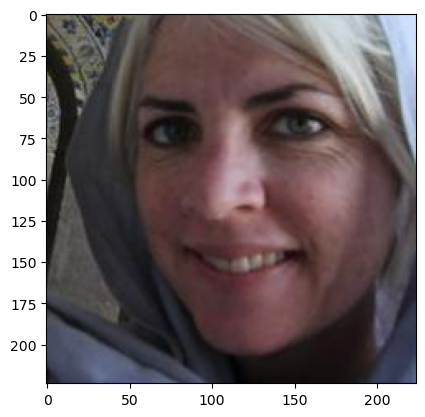

----------------------
723
Actual:  White
Predicted:  Latino_Hispanic


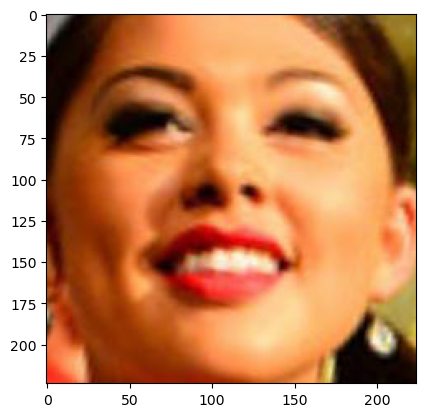

----------------------
750
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


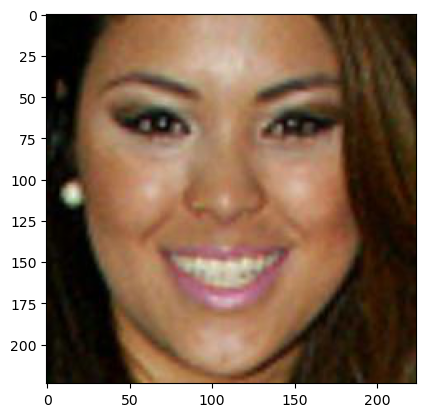

----------------------
758
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


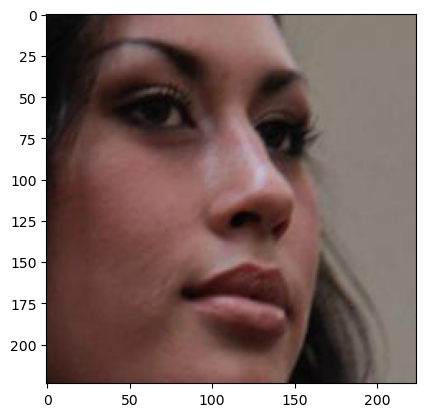

----------------------
762
Actual:  Black
Predicted:  Black


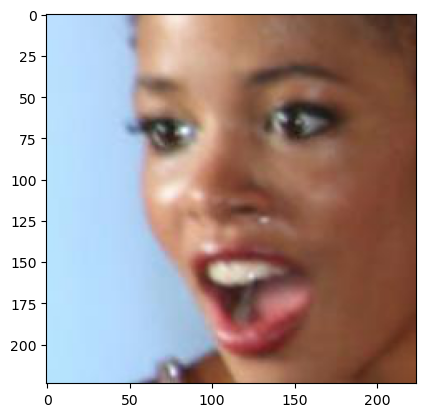

----------------------
817
Actual:  Asian
Predicted:  Asian


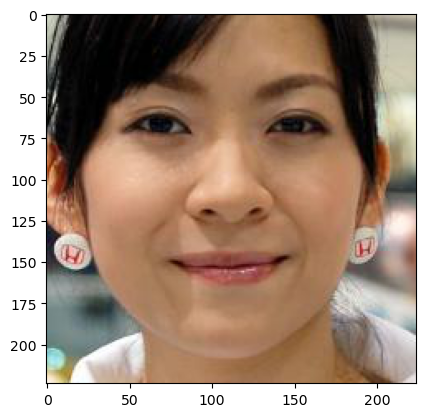

----------------------
875
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


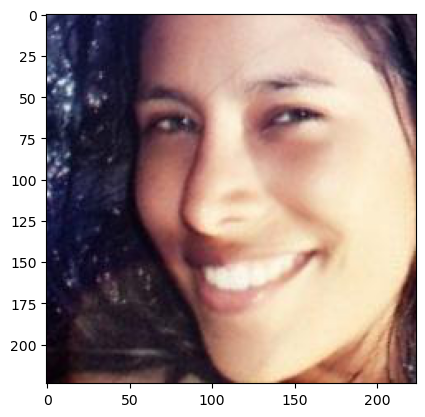

----------------------
899
Actual:  Indian
Predicted:  Indian


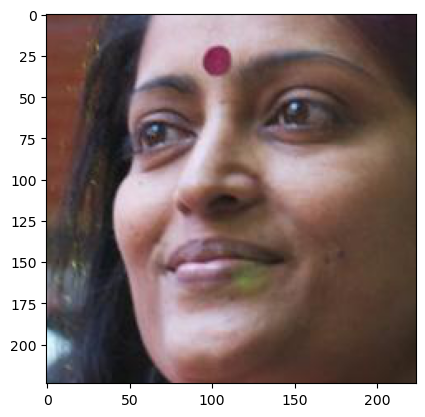

----------------------
913
Actual:  Black
Predicted:  Black


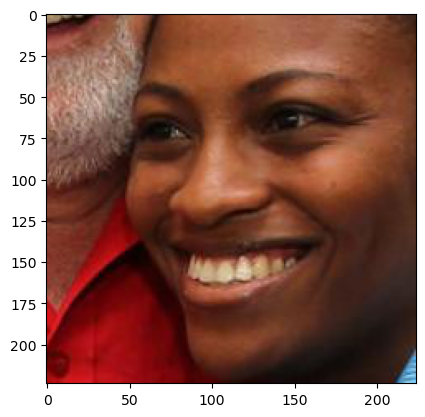

----------------------
992
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


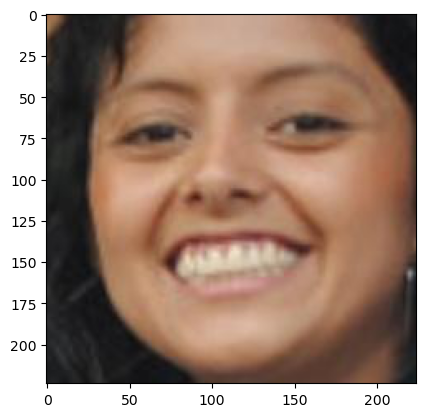

----------------------
1061
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


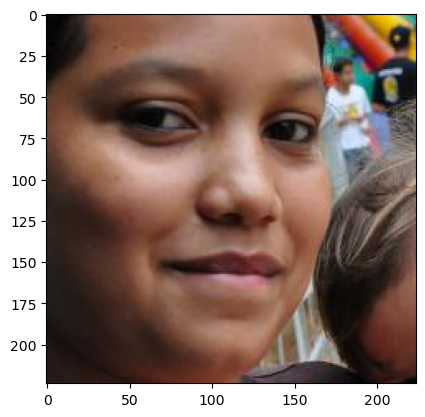

----------------------
1088
Actual:  Middle Eastern
Predicted:  Middle Eastern


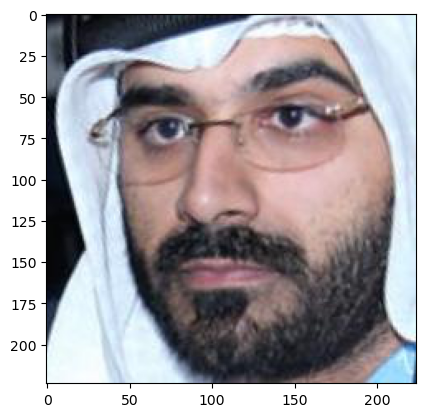

----------------------
1094
Actual:  Indian
Predicted:  Indian


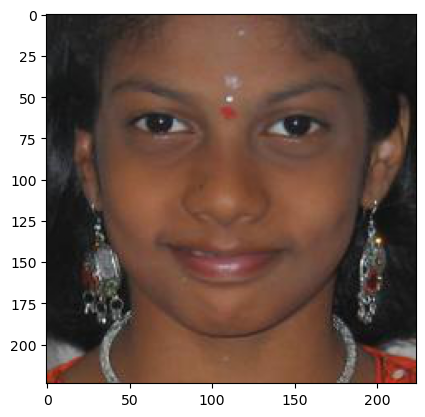

----------------------
1180
Actual:  Indian
Predicted:  Indian


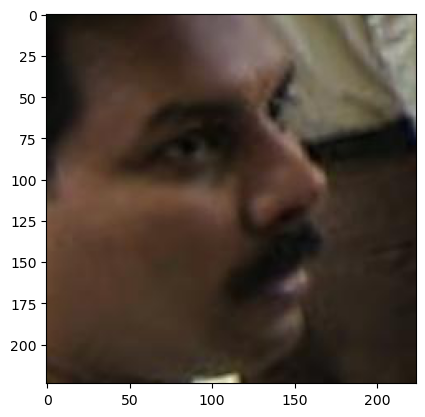

----------------------
1223
Actual:  Asian
Predicted:  Asian


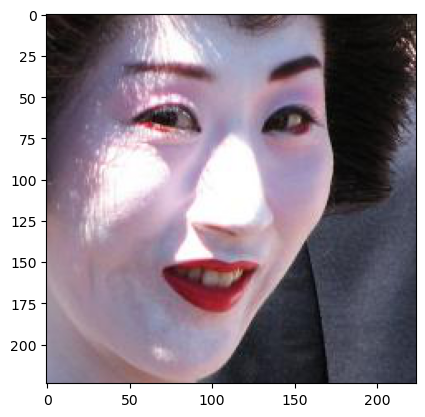

----------------------
1250
Actual:  Indian
Predicted:  Indian


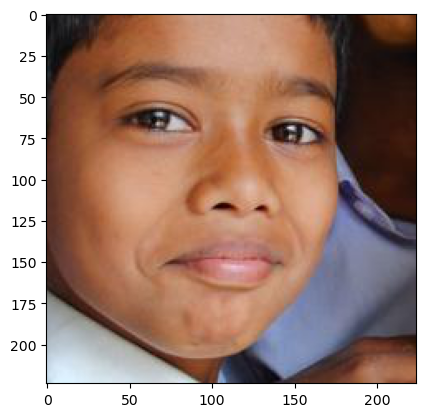

----------------------
1258
Actual:  White
Predicted:  White


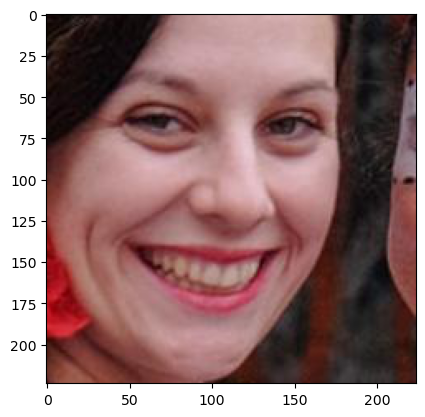

----------------------
1274
Actual:  White
Predicted:  White


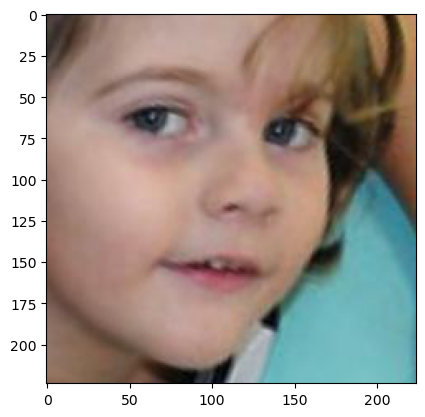

----------------------
1340
Actual:  Black
Predicted:  Black


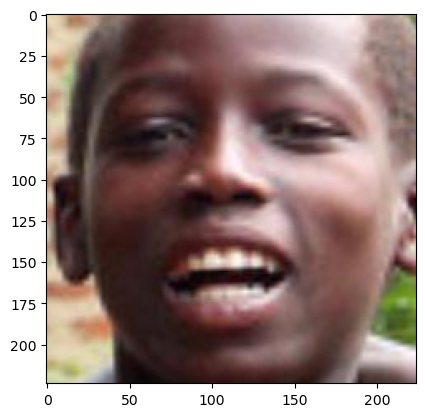

----------------------
1363
Actual:  Black
Predicted:  Black


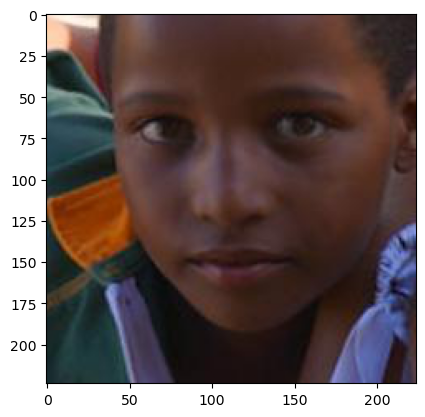

----------------------
1377
Actual:  Asian
Predicted:  Asian


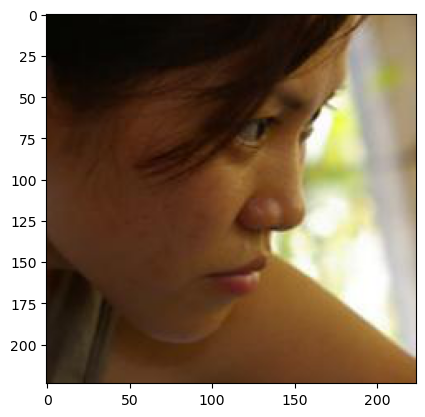

----------------------
1395
Actual:  Indian
Predicted:  Indian


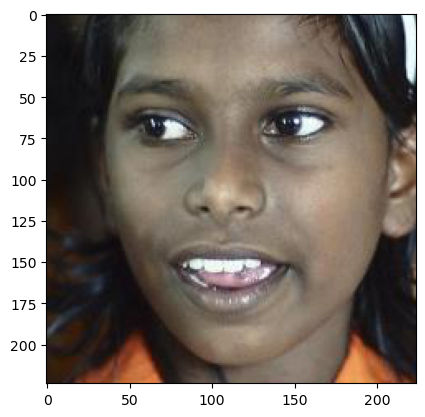

----------------------
1430
Actual:  White
Predicted:  White


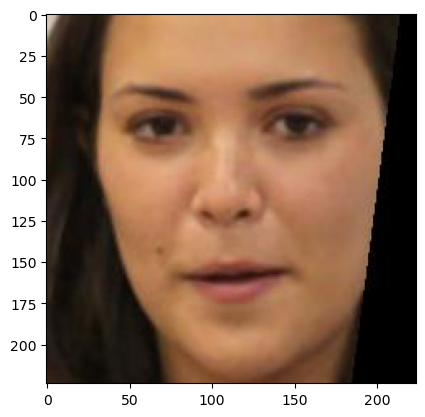

----------------------
1460
Actual:  Middle Eastern
Predicted:  Middle Eastern


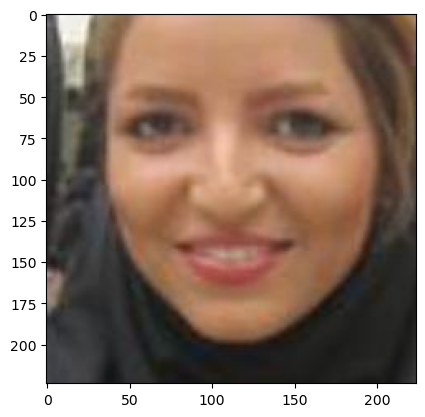

----------------------
1485
Actual:  White
Predicted:  White


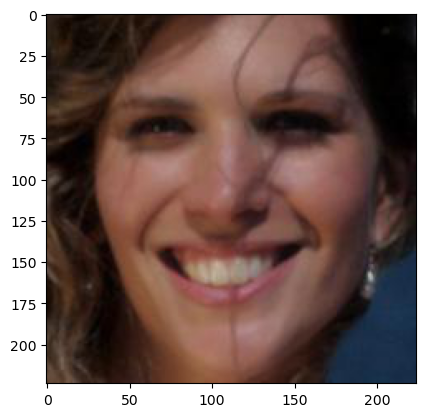

----------------------
1556
Actual:  Indian
Predicted:  Indian


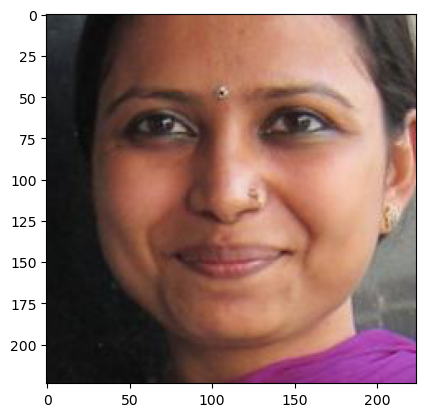

----------------------
2181
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


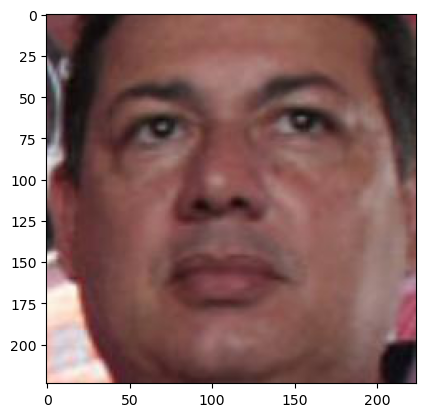

----------------------
2205
Actual:  Black
Predicted:  Black


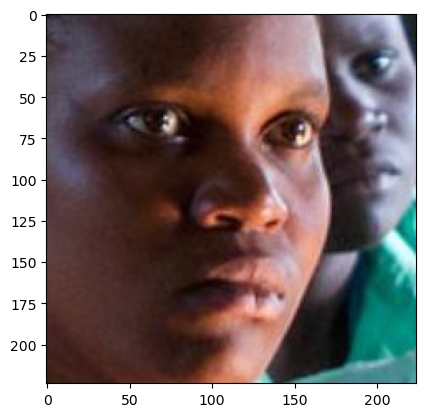

----------------------
2255
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


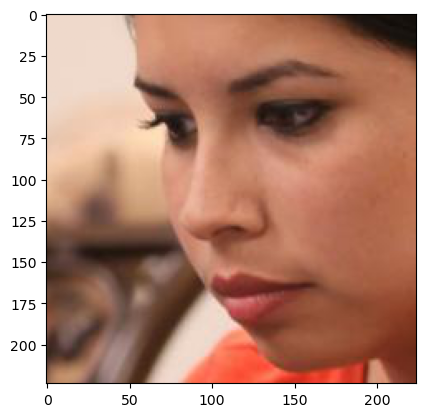

----------------------
4396
Actual:  Middle Eastern
Predicted:  Middle Eastern


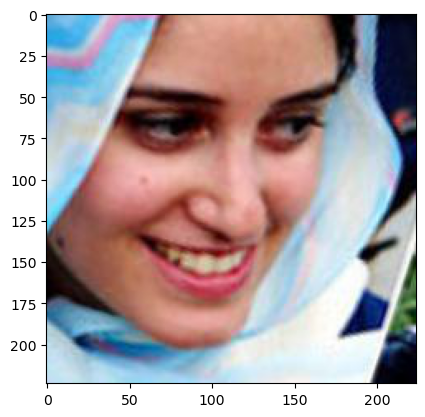

----------------------
4477
Actual:  Middle Eastern
Predicted:  White


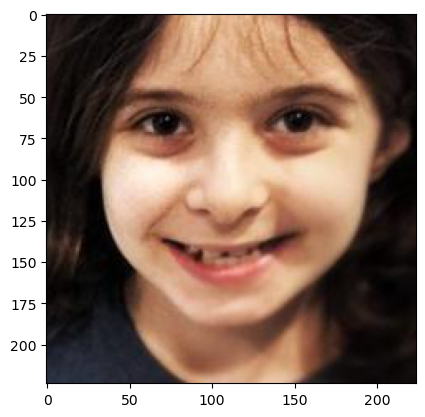

----------------------
4725
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


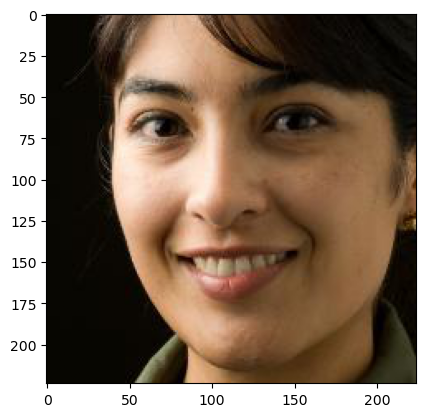

----------------------
4944
Actual:  Latino_Hispanic
Predicted:  Latino_Hispanic


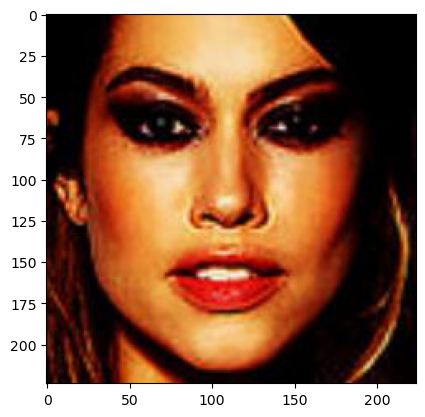

----------------------


In [55]:
prediction_classes = []; actual_classes = []

for i in range(0, predictions.shape[0]):
    prediction = np.argmax(predictions[i])
    prediction_classes.append(races[prediction])
    actual = np.argmax(test_target.values[i])
    actual_classes.append(races[actual])
    
    if i in [
        375, 470, 750, 758, 875, 992, 1061, 2181, 2255, 4725, 4944 #latino
        , 124, 339, 762, 913, 1340, 1363, 2205 #black
        , 33, 83, 237, 609, 817, 1223, 1377 #asian
        , 109, 203, 899, 1094, 1180, 1250, 1395, 1556 #indian
        , 638, 718, 1088, 1460, 4396, 4477 #middle eastern
        , 413, 447, 573, 649, 723, 1258, 1274, 1430, 1485 #white
        , 17, 235, #misclassified
    ]:
        print(i)
        print("Actual: ",races[actual])
        print("Predicted: ",races[prediction])
        
        img = (test_df.iloc[i]['pixels'].reshape([224, 224, 3])) / 255
        plt.imshow(img)
        plt.show()
        print("----------------------")

# Predictions for images out of the data set

In [41]:
races = ['Asian', 'Indian', 'Black', 'White', 'Middle Eastern', 'Latino_Hispanic']

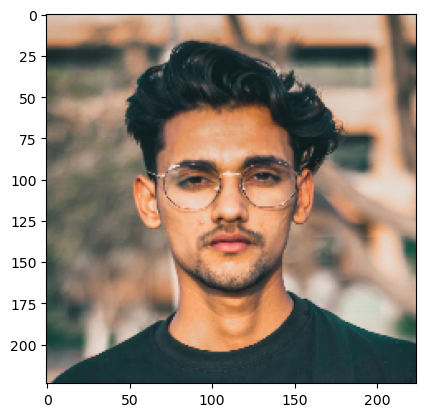

1/1 [==============================] - 1s 819ms/step
Prediction:  Middle Eastern
---------------------------


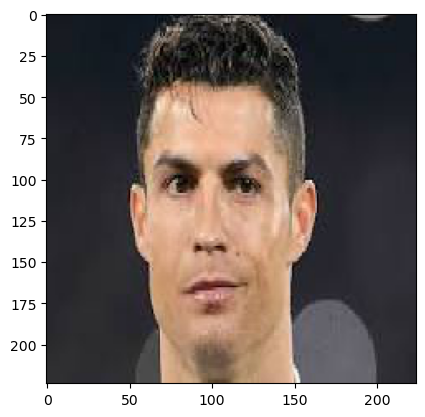

1/1 [==============================] - 1s 825ms/step
Prediction:  White
---------------------------


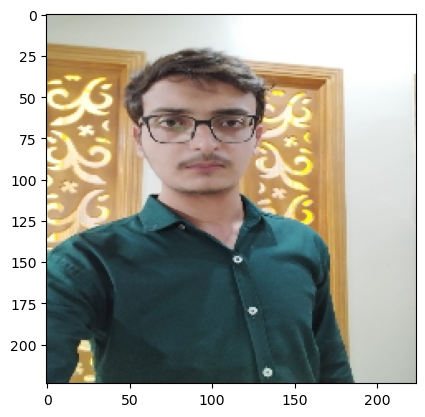

1/1 [==============================] - 1s 811ms/step
Prediction:  Asian
---------------------------


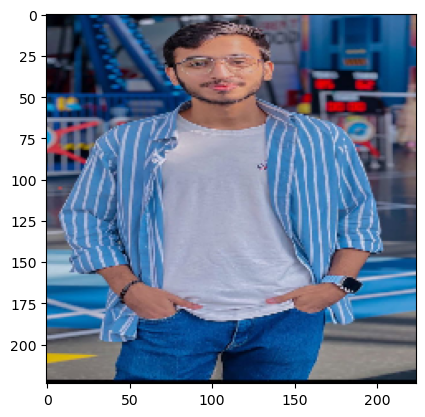

1/1 [==============================] - 1s 831ms/step
Prediction:  Asian
---------------------------


In [58]:
demo_set = ['ADD.jpg','ANY.jpg', 'IMAGE.jpg', 'HERE.jpg']

for file in demo_set:
    path = 'demo/%s' % (file) 
    img = image.load_img(path, grayscale=False, target_size=(224, 224, 3))
    img = image.img_to_array(img).reshape(1, -1)[0]
    img = img.reshape(224, 224, 3)
    img = img / 255
    
    plt.imshow(img)
    plt.show()
    
    img = np.expand_dims(img, axis=0) 

    prediction_proba = race_model.predict(img)

    print("Prediction: ",races[np.argmax(prediction_proba)])
    print("---------------------------")